# super resolution

In [1]:
import os
import torch
import torchvision
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from math import log10, sqrt
import glob
from PIL import Image
import cv2
import tensorflow as tf
import imageio
import time
import winsound

import matplotlib.pyplot as plt
%matplotlib inline

## set up and load the data

path = 'VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages'
path_save = 'VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/converted'

all_dir = glob.glob(path + '/*.jpg')

for filename in all_dir:
    img = cv2.imread(filename)
    img_y2 = img.resize(288)
    img_y2.save(path_save+'/y_large/'+(filename[len(filename)-10:]))
    img_y = img.resize(144)
    img_y.save(path_save+'/y_mid/'+(filename[len(filename)-10:]))
    img_x = img.resize(72)
    img_x.save(path_save+'/x/'+(filename[len(filename)-10:]))


In [2]:
path = 'VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/converted'

X = []
y_mid = []
y_large = []

X_dir = glob.glob(path + '/x/*.jpg')
y_mid_dir = glob.glob(path + '/y_mid/*.jpg')
y_large_dir = glob.glob(path + '/y_large/*.jpg')

for filename in X_dir:
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    X.append(img)
for filename in y_mid_dir:
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    y_mid.append(img)
for filename in y_large_dir:
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    y_large.append(img)

valid_size= int(0.2*len(X))
x_valid = X[0:valid_size]
x_train=X[valid_size:]
y_mid_valid = y_mid[0:valid_size]
y_mid_train=y_mid[valid_size:]
y_large_valid = y_large[0:valid_size]
y_large_train=y_large[valid_size:]


## some examples of the data

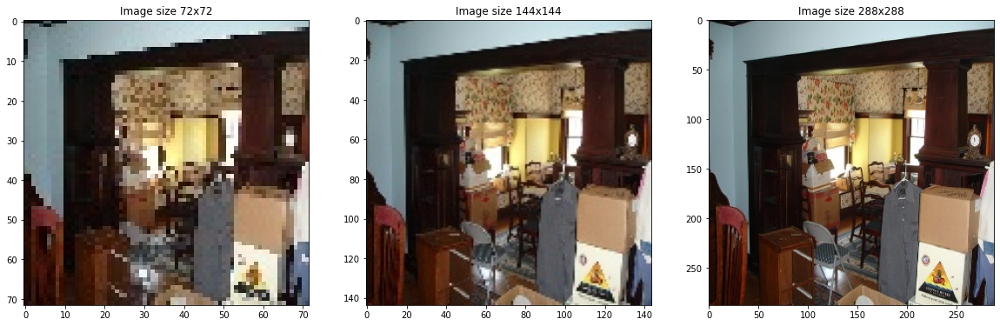

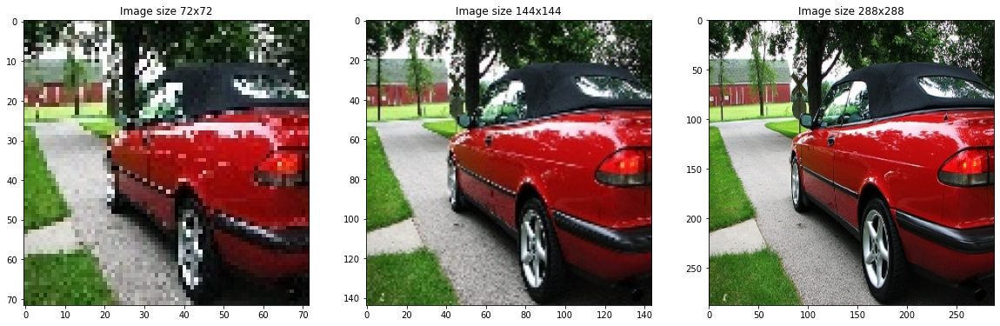

In [209]:
def plot_sample(X, y_mid, y_large, index):
    _, aux = plt.subplots(1, 3, figsize=(20, 10))
    aux[0].set_title('Image size 72x72')
    aux[0].imshow(X[index])
    aux[1].set_title('Image size 144x144')
    aux[1].imshow(y_mid[index])
    aux[2].set_title('Image size 288x288')
    aux[2].imshow(y_large[index])

plot_sample(X, y_mid, y_large,0)
plot_sample(X, y_mid, y_large,1)

In [3]:
class ImageDataSet(Dataset):
    def __init__(self, x, y_mid, y_large):
        self.x = x
        self.y_mid = y_mid
        self.y_large = y_large
        
    def __len__(self):
        return len(self.x)
    
    def __getitem__(self, idx):
        img_x = self.x[idx]
        img_y_mid = self.y_mid[idx]
        img_y_large = self.y_large[idx]
        return img_x.T, img_y_mid.T, img_y_large.T

In [4]:
train_dataset = ImageDataSet(x_train, y_mid_train, y_large_train)
train_dataloader = DataLoader(train_dataset, batch_size= 20, num_workers =0, shuffle=False, pin_memory= False)
print(len(train_dataset))

valid_dataset = ImageDataSet(x_valid, y_mid_valid, y_large_valid)
valid_dataloader = DataLoader(valid_dataset, batch_size= 20, num_workers =0, shuffle=False, pin_memory= False)
print(len(valid_dataset))

4009
1002


In [5]:
use_cuda = torch.has_cuda

if use_cuda:
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu:0')
device = torch.device('cpu:0')

## main function for the model

In [6]:
def train(train_loader, valid_loader, learn_rate, epochs=5, large=False, model=None):
    # train part
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
    model.train()
    epoch_times = []
    train_log = []
    gif = []
    preds = None
    valid_preds = None
    flag = True
    for epoch in range(epochs):
        counter1 = 0
        start_time = time.process_time()
        check = 0
        avg_loss = 0
        step = 0
        psnr_sum = 0
        print("starting epoch number ", epoch)
        for x_train, y_mid_train, y_large_train in train_loader:
            step +=1
            if large:
                labels = y_large_train
            else:
                labels = y_mid_train
            
            output = model(x_train.to(device, dtype=torch.float), large)
            model.zero_grad()
            loss = criterion(output, labels.to(device, dtype=torch.float))
            loss.backward() #retain_graph=True
            optimizer.step()
            avg_loss += loss.item()
            
            if step%20 == 0:
                print("Epoch {}......Step: {}/{}....... Average Loss for Epoch: {}".format(epoch, step, len(train_loader), avg_loss/step))
        current_time = time.process_time()
        print("Epoch {}/{} Done, Total Loss: {}".format(epoch, epochs, avg_loss/len(train_loader)))
        print("Time Elapsed for Epoch: {} seconds".format(str(current_time-start_time)))
        epoch_times.append(current_time-start_time)

        # eval part
        tp = 0
        valid_loss = 0
        model.eval()
        for x_valid, y_mid_valid, y_large_valid in valid_loader:
            x_valid = x_valid.to(device, dtype=torch.float)
            y_mid_valid = y_mid_valid.to(device, dtype=torch.long)
            y_large_valid = y_large_valid.to(device, dtype=torch.long)
            
            with torch.no_grad():
                output2 = model(x_valid, large)
                loss = criterion(output2, y_mid_valid)
                valid_loss += loss.item()
                output3 = output2
                image_pred = output3[0]
                image_pred = image_pred.float().cpu().detach().numpy().T
                image_original = y_mid_valid[0]
                image_original = image_original.float().cpu().detach().numpy().T
                tp += (y_mid_valid==output2.to(device)).type(torch.float).sum().item()
                mse = np.mean((image_original - image_pred) ** 2)
                psnr = 100
                if mse != 0:
                    psnr = 20 * log10(255.0 / sqrt(mse))
                psnr_sum += psnr
                counter1 = counter1 + 1
                if valid_preds is None:
                    ma = output3
                    valid_preds = ma.float().cpu().detach()
                else:
                    ma = output3
                    valid_preds = torch.cat((valid_preds, ma.float().cpu().detach()), dim=0)
                
        if preds is None:
            preds = valid_preds
        else:
            preds = torch.cat((preds, valid_preds), dim=0)
        metrics = {
            'epoch': epoch,
            'train_loss': avg_loss/len(train_loader),
            'validation_loss' : valid_loss / len(valid_loader),
            'val_preds': valid_preds,
            'val_score': tp/len(train_loader.dataset)
        }
        train_log.append(metrics)
        gif.append(preds[0])
        print(f'PSNR avg = {psnr_sum/counter1},test_loss = {valid_loss/len(valid_loader):2f}, score = {tp/len(train_loader.dataset)}')
    print("Total Training Time: {} seconds".format(str(sum(epoch_times))))
    return gif, preds, train_log

In [7]:
def printImages(gif1, preds1):
    epo = len(gif1)
    rows = (int(epo/5))+1
    fig, ax = plt.subplots(rows, 5)
    fig.set_size_inches(18.5, 10.5)
    fig.suptitle("image through the epochs", fontsize=18)
    plt.subplots_adjust(hspace=0.5)
    gif13 = gif1
    for i in range(len(gif1)):
        gif13[i] = torch.tensor(gif1[i]).numpy().T.astype(np.float32)/255.0
        ax[int((i)/5), (i%5)].imshow(gif13[i])
        str1 = 'epoch number' + str(i+1)
        ax[int((i)/5), (i%5)].set_title(str1)
        
    imageio.mimsave('movie2.gif', gif1)
    
    for i in range(10): # i replace len(x_valid) in 10 beacuse it too big
        fig = plt.figure()
        fig.set_size_inches(18.5, 10.5)
        ax = fig.add_subplot(1, 3, 1)

        image_x1 = x_valid[i]
        image_x1 = image_x1.astype(np.float32)/255.0
        imgplot = plt.imshow(image_x1)

        ax = fig.add_subplot(1, 3, 2)
        image12 = preds1[i]
        image12 = image12.numpy().T.astype(np.float32)/255.0
        imgplot = plt.imshow(image12)

        ax = fig.add_subplot(1, 3, 3)
        image_y1 = y_mid_valid[i]
        image_y1 = image_y1.astype(np.float32)/255.0
        imgplot = plt.imshow(image_y1)
        
    

In [8]:
def print_result(tr=None, epochs=5, val_labels=None, test_preds=None):
    #print("the auc is:")
    #print(auc(torch.from_numpy(pd.get_dummies(val_labels).values), test_preds.data.cpu(), average = 'macro'))
    epoch_array = [] 
    tr_loss_array = []
    val_loss_array = []
    val_score_array = []
    for metric in tr:
        epoch_array.append(metric['epoch'])
        tr_loss_array.append(metric['train_loss'])
        val_loss_array.append(metric['validation_loss'])
        val_score_array.append( metric['val_score'] )
    plt.plot(epoch_array, tr_loss_array, label = "train loss", color="blue" )
    plt.plot(epoch_array, val_loss_array, label = "valid loss", color="red" )
    plt.xlabel("epoch")
    plt.ylabel("value")

    plt.legend()
    plt.show()
    
    plt.plot(epoch_array, val_score_array, label = "valid score", color="green" )
    plt.xlabel("epoch")
    plt.ylabel("score")
    plt.legend()
    plt.show()

## all model by step and there results

In [8]:
class Step2Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=64, kernel_size=3, padding=1 ).to(device)
        self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=3 , padding=1).to(device)
        self.upsample = nn.Upsample(scale_factor=(144/72))
        self.conv3 = nn.Conv2d(in_channels=64,out_channels=3, kernel_size=1).to(device)

    def forward(self, x, large=False):
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.upsample(out)
        out = self.conv3(out)
        return out

In [9]:
model2 = Step2Model()
gif2, preds2, metrics2 = train(train_loader=train_dataloader, valid_loader=valid_dataloader, learn_rate=0.001, epochs=5, large=False, model=model2)

starting epoch number  0
Epoch 0......Step: 20/201....... Average Loss for Epoch: 2871.470556640625
Epoch 0......Step: 40/201....... Average Loss for Epoch: 1832.7438247680664
Epoch 0......Step: 60/201....... Average Loss for Epoch: 1423.456027730306
Epoch 0......Step: 80/201....... Average Loss for Epoch: 1216.1200687408448
Epoch 0......Step: 100/201....... Average Loss for Epoch: 1090.0814108276368
Epoch 0......Step: 120/201....... Average Loss for Epoch: 999.6085454305013
Epoch 0......Step: 140/201....... Average Loss for Epoch: 933.985956464495
Epoch 0......Step: 160/201....... Average Loss for Epoch: 887.1283069610596
Epoch 0......Step: 180/201....... Average Loss for Epoch: 848.6185184054905
Epoch 0......Step: 200/201....... Average Loss for Epoch: 815.0140962219239
Epoch 0/5 Done, Total Loss: 813.3238025874048
Time Elapsed for Epoch: 290.25 seconds
PSNR avg = 21.26132966564679,test_loss = 512.362102, score = 0.010226989274133201
starting epoch number  1
Epoch 1......Step: 20/201

<ipython-input-7-cda49081dc91>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gif13[i] = torch.tensor(gif1[i]).numpy().T.astype(np.float32)/255.0
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float32 to uint8. Range [-0.00987954717129469, 1.034487247467041]. Convert image to uint8 prior to saving to suppress this warn

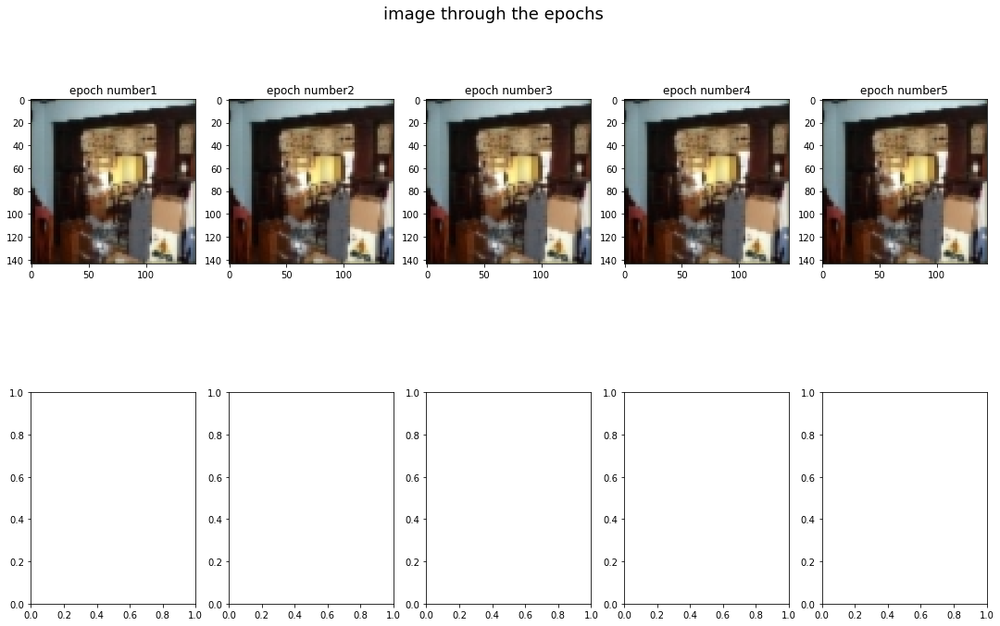

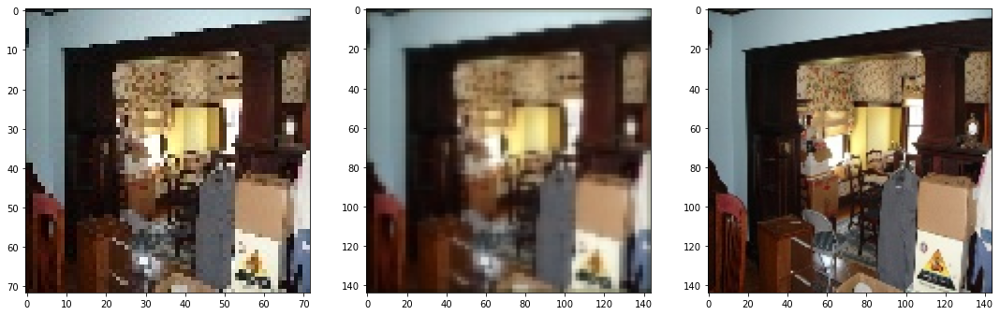

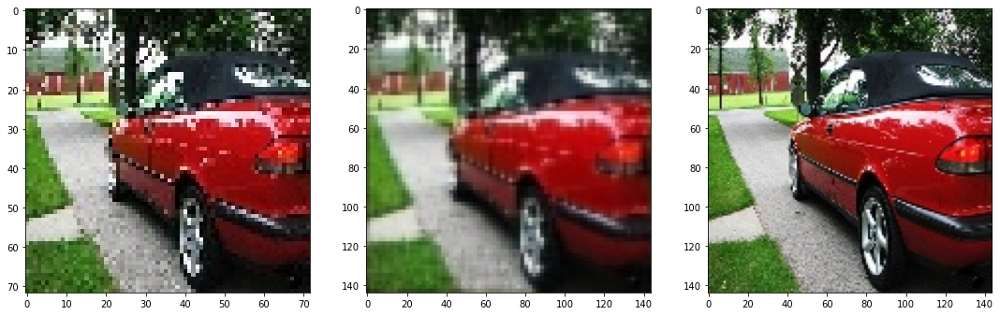

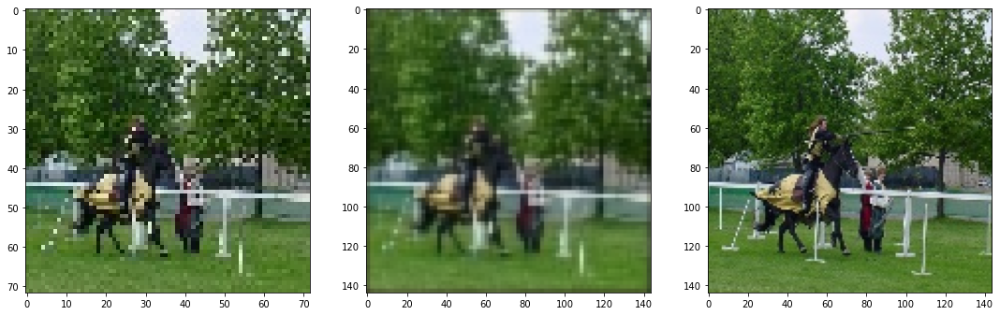

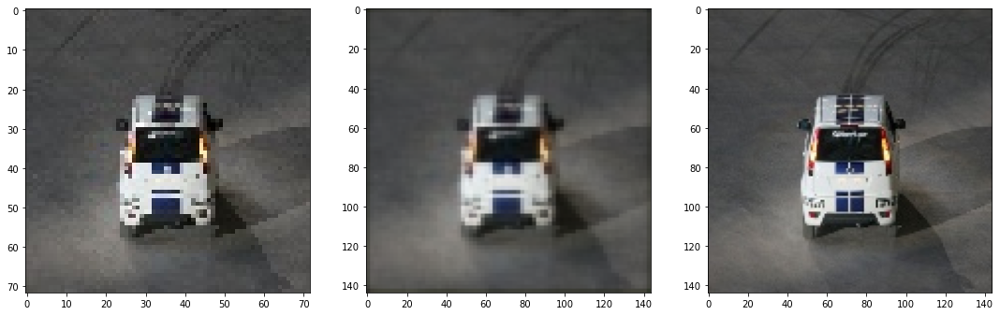

...

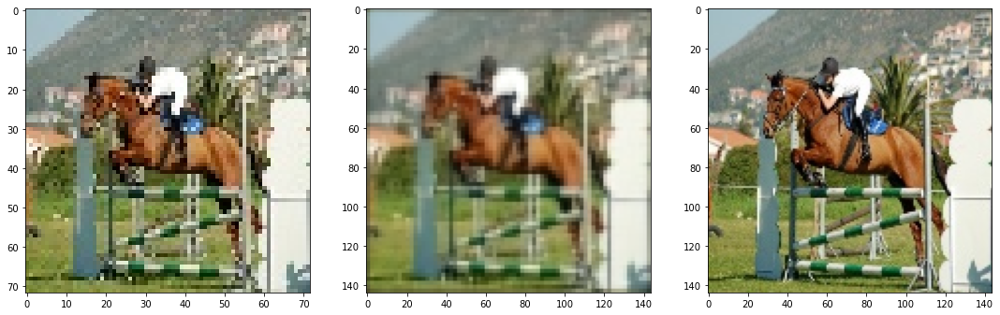

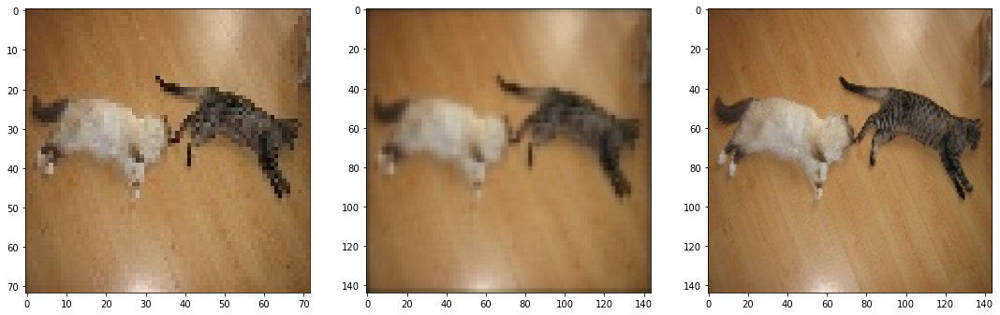

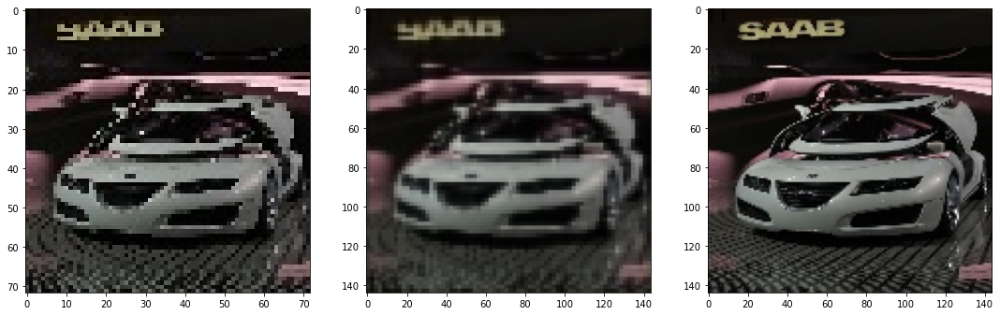

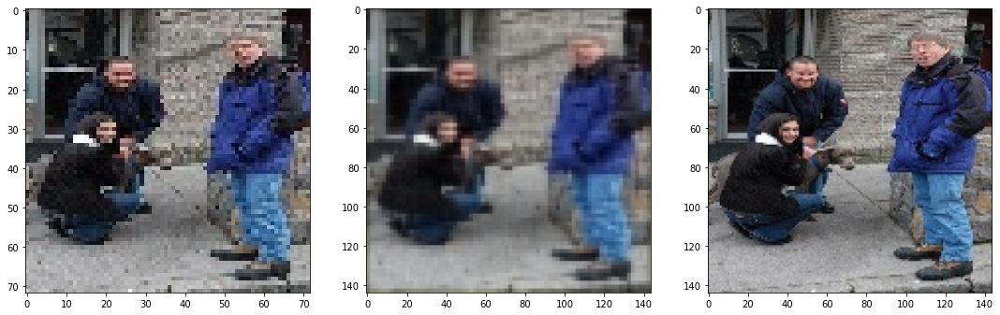

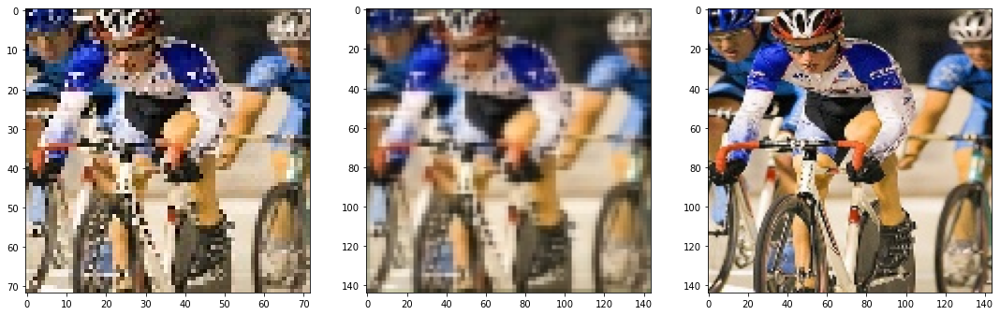

In [10]:
printImages(gif2, preds2)

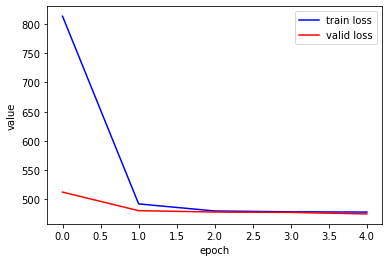

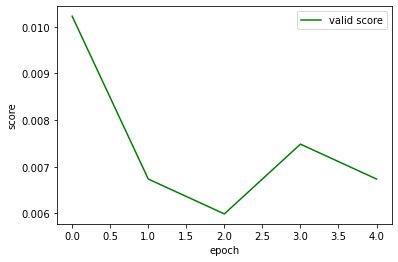

In [14]:
print_result(tr=metrics2, epochs=5)

In [11]:
class Step3Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=64, kernel_size=3, padding=1 ).to(device)
        self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=3 , padding=1).to(device)
        self.upsample = nn.Upsample(scale_factor=(144/72))
        self.conv3 = nn.Conv2d(in_channels=64,out_channels=3, kernel_size=1 ).to(device)
        self.upsample2 = nn.Upsample(scale_factor=(288/144))

    def forward(self, x, large=False):
        out= self.conv1(x)
        out= self.conv2(out)
        out= self.upsample(out)
        if large:
            out = self.upsample2(out)
        out= self.conv3(out)
        return out

In [12]:
model3 = Step3Model()
gif3, preds3, metrics3 = train(train_loader=train_dataloader, valid_loader=valid_dataloader, learn_rate=0.001, epochs=5, large=False, model=model3)

starting epoch number  0
Epoch 0......Step: 20/201....... Average Loss for Epoch: 2617.1402954101563
Epoch 0......Step: 40/201....... Average Loss for Epoch: 1706.575491333008
Epoch 0......Step: 60/201....... Average Loss for Epoch: 1344.761382039388
Epoch 0......Step: 80/201....... Average Loss for Epoch: 1161.1228355407716
Epoch 0......Step: 100/201....... Average Loss for Epoch: 1049.035796508789
Epoch 0......Step: 120/201....... Average Loss for Epoch: 967.7161801656088
Epoch 0......Step: 140/201....... Average Loss for Epoch: 908.5562840053013
Epoch 0......Step: 160/201....... Average Loss for Epoch: 866.3782695770263
Epoch 0......Step: 180/201....... Average Loss for Epoch: 831.3998167249891
Epoch 0......Step: 200/201....... Average Loss for Epoch: 800.5112057495118
Epoch 0/5 Done, Total Loss: 798.9262406837881
Time Elapsed for Epoch: 311.453125 seconds
PSNR avg = 21.180757269920488,test_loss = 521.149234, score = 0.006984285357944624
starting epoch number  1
Epoch 1......Step: 2

<ipython-input-7-cda49081dc91>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gif13[i] = torch.tensor(gif1[i]).numpy().T.astype(np.float32)/255.0
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float32 to uint8. Range [-0.025835340842604637, 1.0222660303115845]. Convert image to uint8 prior to saving to suppress this wa

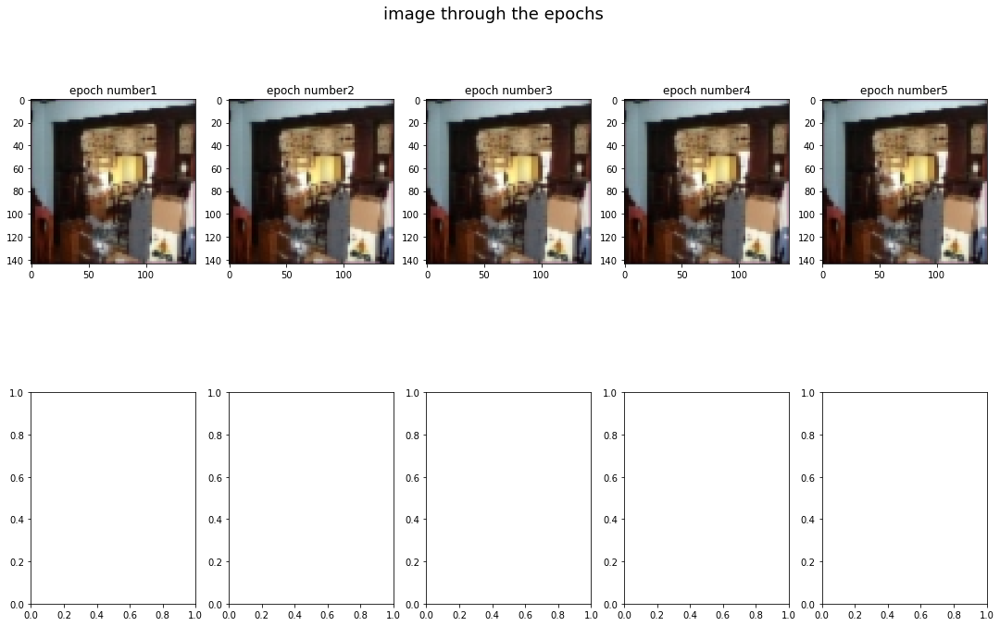

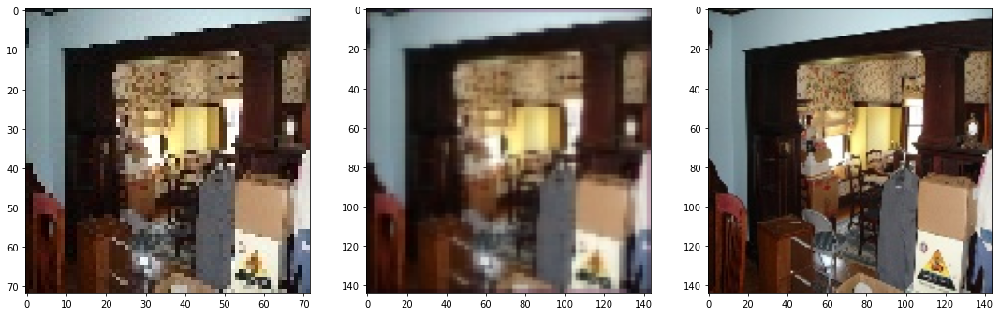

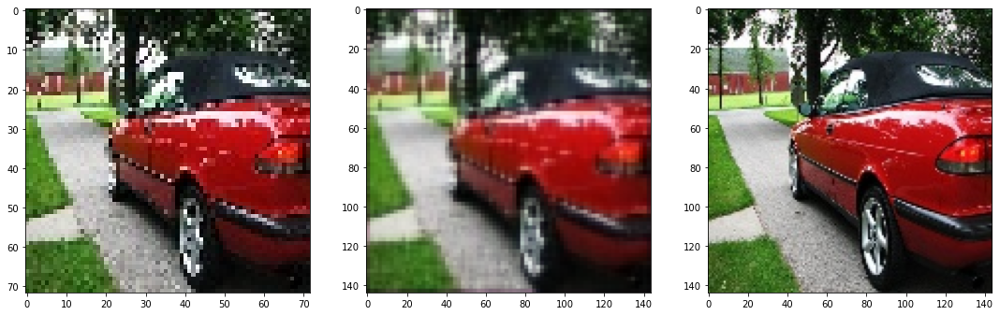

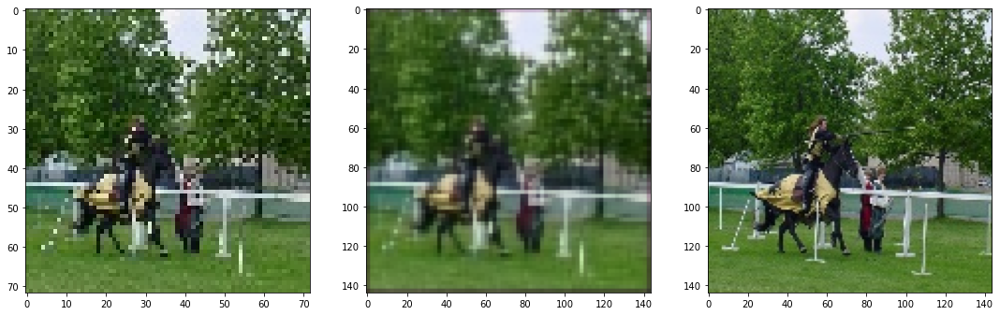

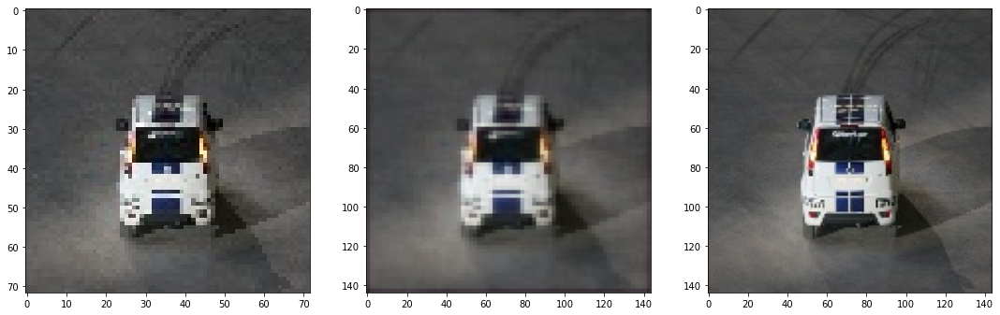

...

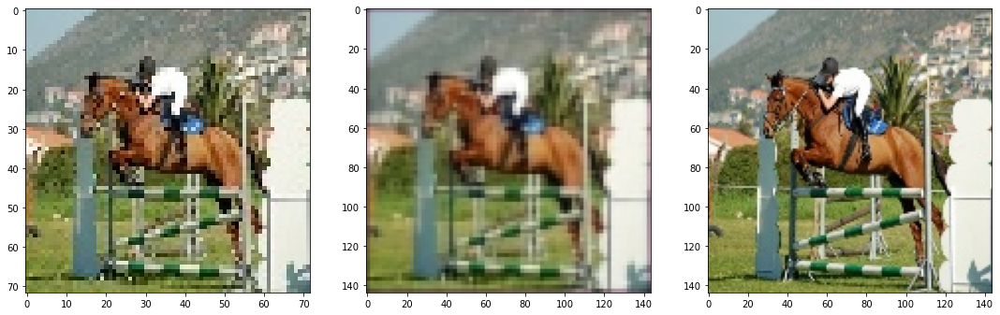

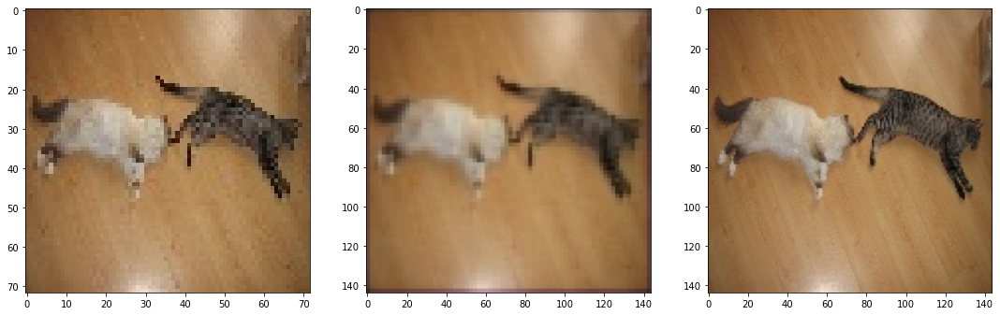

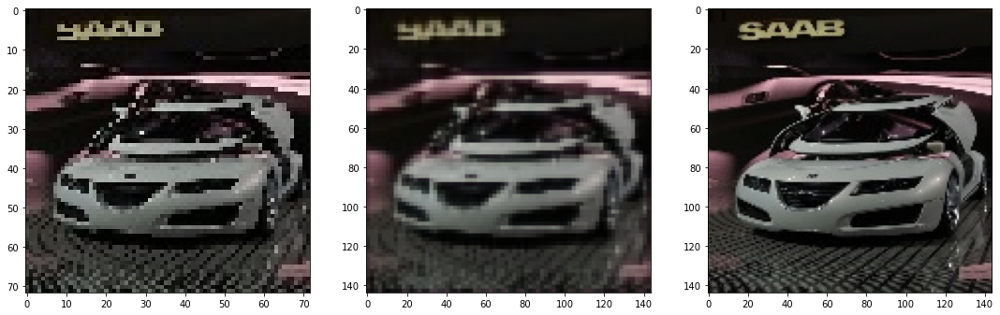

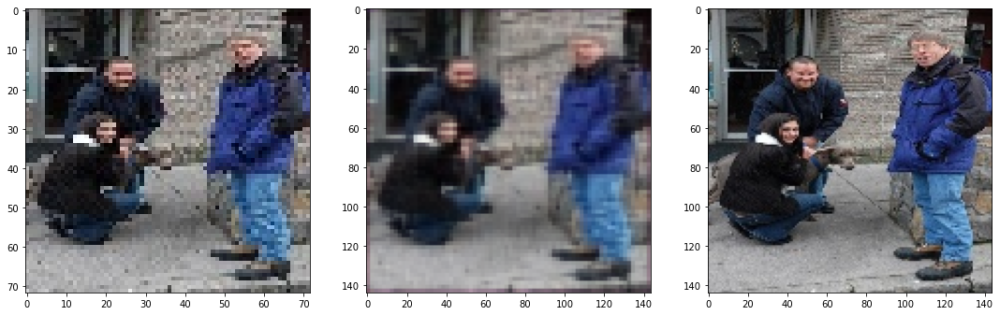

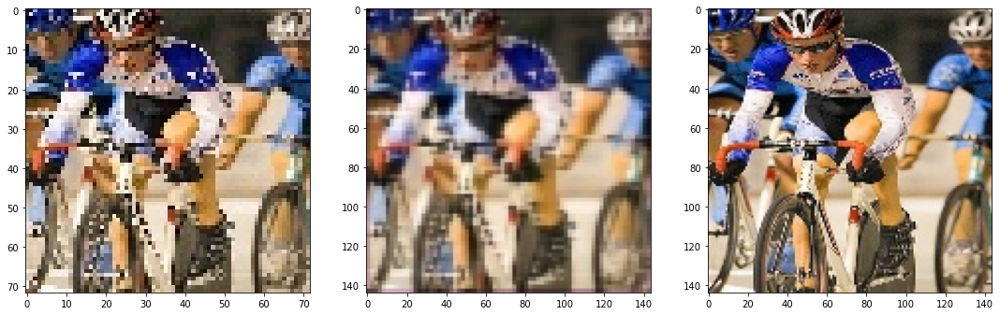

In [15]:
printImages(gif3, preds3)

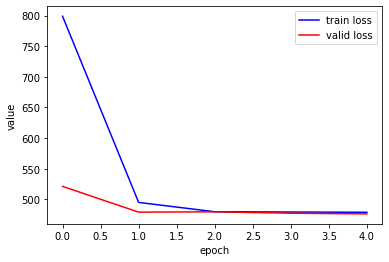

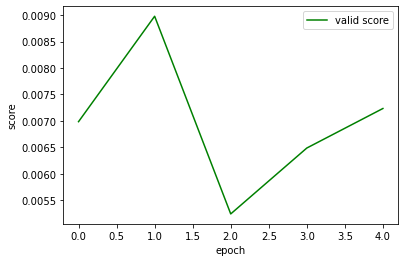

In [16]:
print_result(tr=metrics3, epochs=5)

In [9]:
class Step4Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.conv3 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.conv4 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.conv5 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.conv6 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.conv7 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.upsample = nn.Upsample(scale_factor=(144/72)).to(device) #, mode='bilinear'
        self.conv8 = nn.Conv2d(in_channels=32,out_channels=3, kernel_size=1)
        self.upsample2 = nn.Upsample(scale_factor=(288/144)).to(device)
        self.relu = nn.ReLU()

    def forward(self, x, large=False):
        out = self.conv1(x)
        
        out1 = self.conv2(out)
        out2 = self.conv3(out1)
        out_add1 = torch.add(out, out2)
        out_relu1 = self.relu(out_add1)
        
        out3 = self.conv4(out_relu1)
        out4 = self.conv5(out3)
        out_add2 = torch.add(out4, out_relu1)
        out_relu2 = self.relu(out_add2)
        
        out5 = self.upsample(out_relu2)
        #out = self.relu(out)
        if large:
            out6 = self.conv6(out5)
            out7 = self.conv7(out6)
            out_add3 = torch.add(out7, out5)
            out_relu3 = self.relu(out_add3)
            out5 = self.upsample2(out_relu3)
            #out = self.relu(out)
        #out = self.drop(out)
        out6 = self.conv8(out5)
        #out = self.relu(out)
        return out6

In [10]:
model4 = Step4Model()
gif4, preds4, metrics4 = train(train_loader=train_dataloader, valid_loader=valid_dataloader, learn_rate=0.001, epochs=5, large=False, model=model4)

starting epoch number  0
Epoch 0......Step: 20/201....... Average Loss for Epoch: 2211.600720214844
Epoch 0......Step: 40/201....... Average Loss for Epoch: 1528.368537902832
Epoch 0......Step: 60/201....... Average Loss for Epoch: 1240.0739313761394
Epoch 0......Step: 80/201....... Average Loss for Epoch: 1078.7604175567626
Epoch 0......Step: 100/201....... Average Loss for Epoch: 975.7123654174804
Epoch 0......Step: 120/201....... Average Loss for Epoch: 899.8882741292317
Epoch 0......Step: 140/201....... Average Loss for Epoch: 845.0001711164202
Epoch 0......Step: 160/201....... Average Loss for Epoch: 805.1895975112915
Epoch 0......Step: 180/201....... Average Loss for Epoch: 773.1579886542427
Epoch 0......Step: 200/201....... Average Loss for Epoch: 744.7353187561035
Epoch 0/5 Done, Total Loss: 743.3547663902169
Time Elapsed for Epoch: 308.15625 seconds
PSNR avg = 21.45352092919197,test_loss = 491.228007, score = 0.007233724120728361
starting epoch number  1
Epoch 1......Step: 20/

<ipython-input-7-cda49081dc91>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gif13[i] = torch.tensor(gif1[i]).numpy().T.astype(np.float32)/255.0
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float32 to uint8. Range [-0.0048330496065318584, 1.0355077981948853]. Convert image to uint8 prior to saving to suppress this w

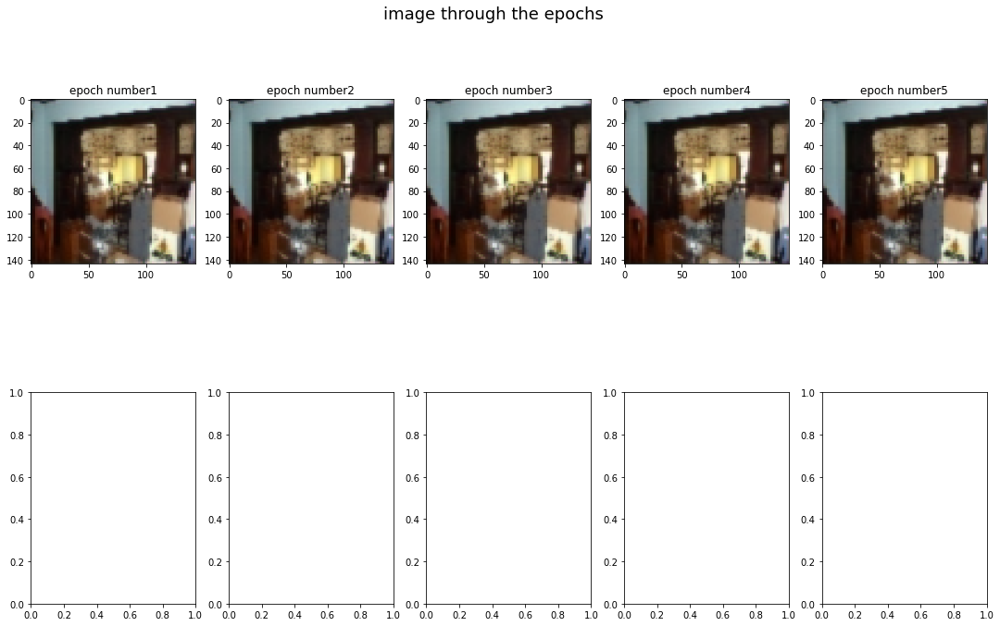

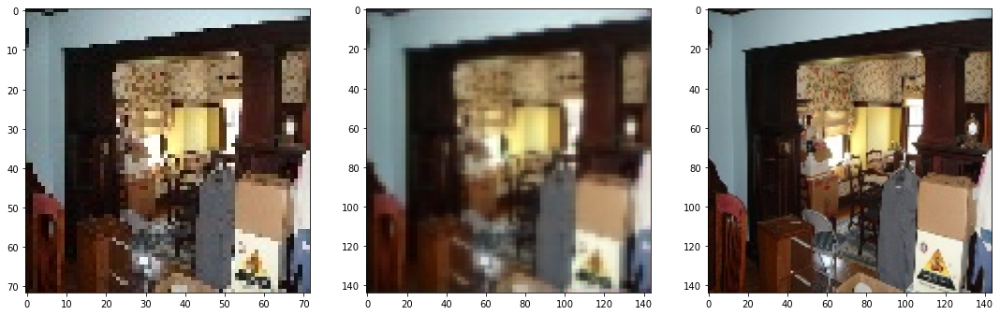

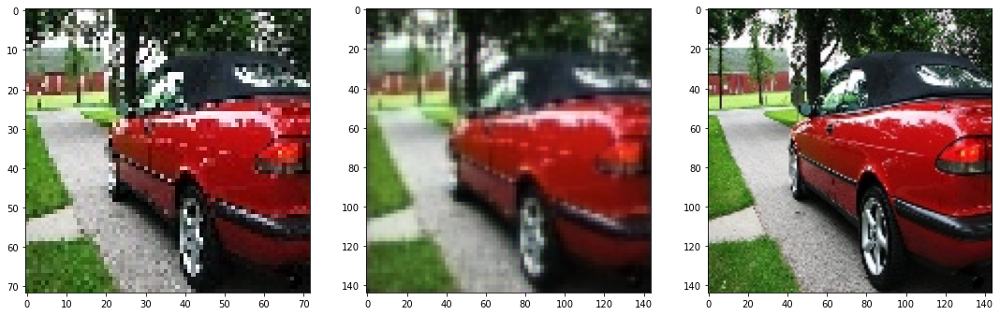

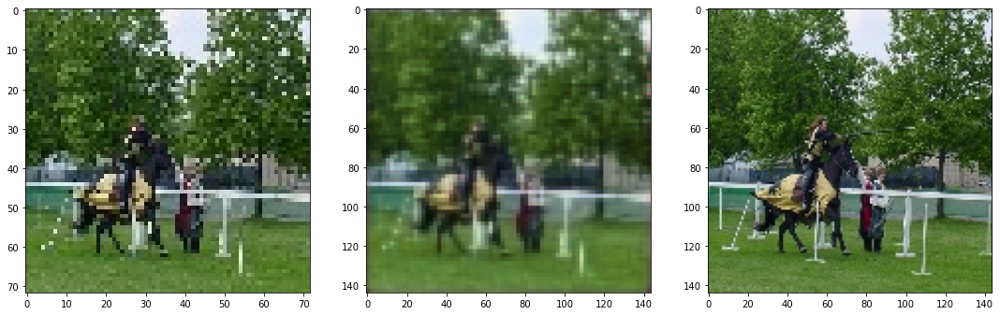

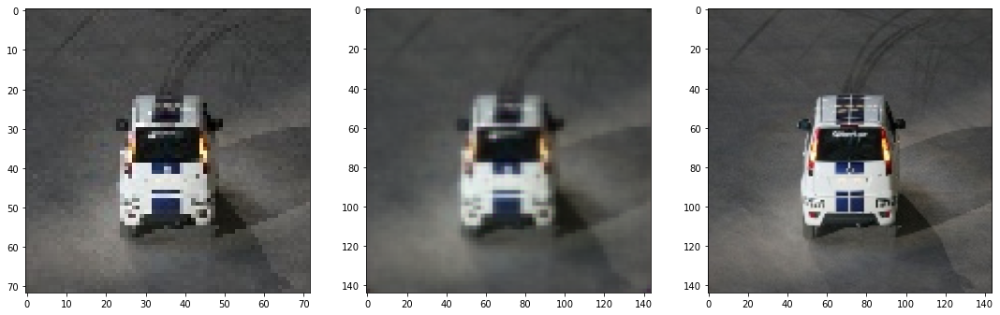

...

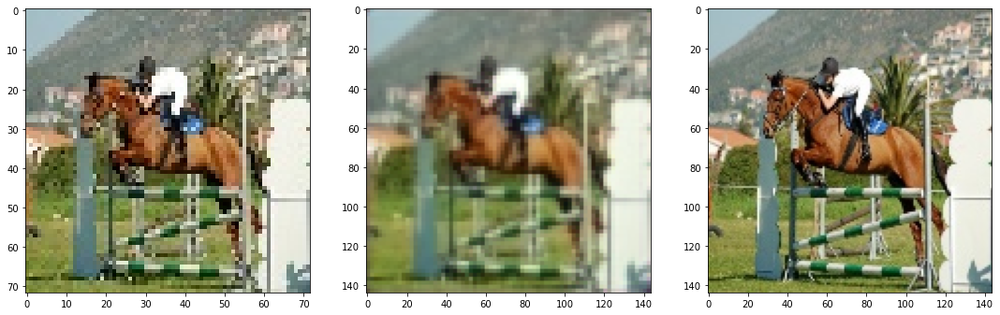

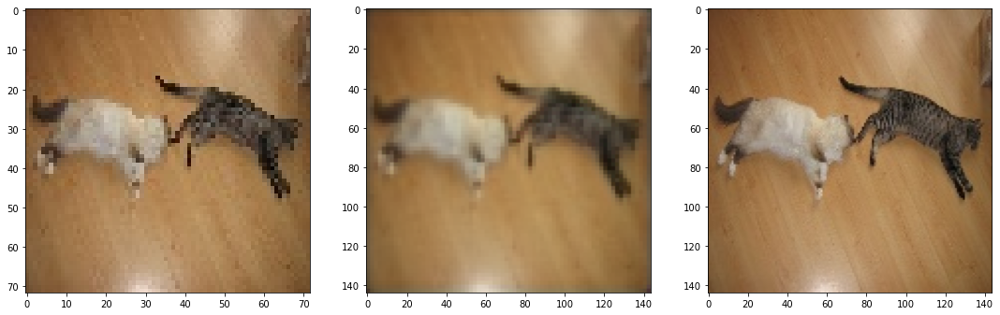

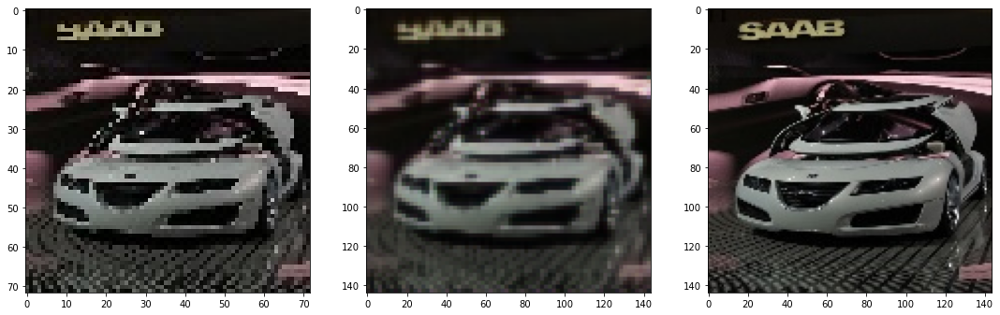

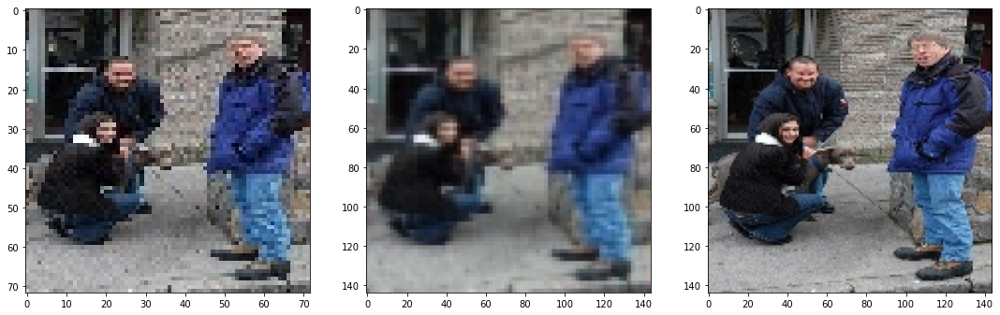

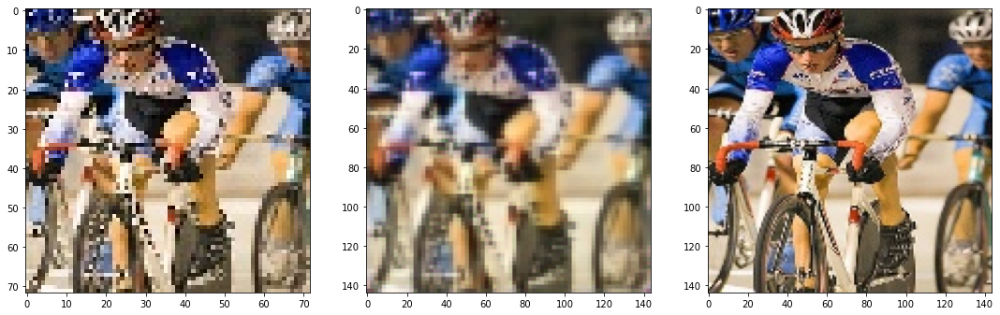

In [11]:
printImages(gif4, preds4)

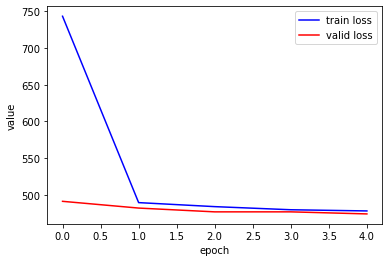

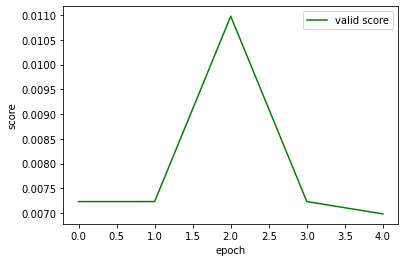

In [12]:
print_result(tr=metrics4, epochs=5)

In [9]:
class ResidualBlock(nn.Module):
    expansion: int = 1
    def __init__(self): 
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.conv2 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=2, dilation=2)
        self.conv3 = nn.Conv2d(in_channels=32,out_channels=32, kernel_size=3, padding=4, dilation=4)
        self.conv4 = nn.Conv2d(in_channels=96,out_channels=32, kernel_size=3, padding=1, dilation=1)
        self.relu = nn.LeakyReLU() #inplace=True
        
    def forward(self, x5):
        rout = self.conv1(x5)
        rout1 = self.conv2(rout)
        rout2 = self.conv3(rout1)
        rout3 = torch.concat((rout, rout1, rout2), dim=1)
        #print(rout3.shape)
        
        rout4 = self.relu(rout3)
        rout5 = self.conv4(rout4)
        #print(rout4.shape)
        return rout5

In [10]:
class Step5Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.resBlock1 = ResidualBlock()
        self.resBlock2 = ResidualBlock()
        self.resBlock3 = ResidualBlock()
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=32, kernel_size=3, padding=1)
        self.upsample = nn.Upsample(scale_factor=(144/72)).to(device) #, mode='bilinear'
        self.conv2 = nn.Conv2d(in_channels=32,out_channels=3, kernel_size=1)
        self.upsample2 = nn.Upsample(scale_factor=(288/144)).to(device)

    def forward(self, x, large=False):
        out = self.conv1(x)
        out1 = self.resBlock1(out)
        out2 = self.resBlock2(out1)
        out3 = self.upsample(out2)
        if large:
            out4 = self.resBlock3(out3)
            out3 = self.upsample2(out4)
        out5 = self.conv2(out3)
        return out5

In [15]:
model5 = Step5Model()
gif5, preds5, metrics5 = train(train_loader=train_dataloader, valid_loader=valid_dataloader, learn_rate=0.001, epochs=5, large=False, model=model5)

starting epoch number  0
Epoch 0......Step: 20/201....... Average Loss for Epoch: 4835.81860961914
Epoch 0......Step: 40/201....... Average Loss for Epoch: 3170.7229919433594
Epoch 0......Step: 60/201....... Average Loss for Epoch: 2464.1813435872396
Epoch 0......Step: 80/201....... Average Loss for Epoch: 2047.228160095215
Epoch 0......Step: 100/201....... Average Loss for Epoch: 1779.0008294677734
Epoch 0......Step: 120/201....... Average Loss for Epoch: 1588.1716796875
Epoch 0......Step: 140/201....... Average Loss for Epoch: 1447.6266278948103
Epoch 0......Step: 160/201....... Average Loss for Epoch: 1343.2247299194337
Epoch 0......Step: 180/201....... Average Loss for Epoch: 1257.6064834594727
Epoch 0......Step: 200/201....... Average Loss for Epoch: 1185.8009846496582
Epoch 0/5 Done, Total Loss: 1182.3680160294718
Time Elapsed for Epoch: 733.703125 seconds
PSNR avg = 21.15682227499503,test_loss = 524.393725, score = 0.006485407832377151
starting epoch number  1
Epoch 1......Step:

<ipython-input-7-cda49081dc91>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gif13[i] = torch.tensor(gif1[i]).numpy().T.astype(np.float32)/255.0
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float32 to uint8. Range [-0.0029801535420119762, 1.073124885559082]. Convert image to uint8 prior to saving to suppress this wa

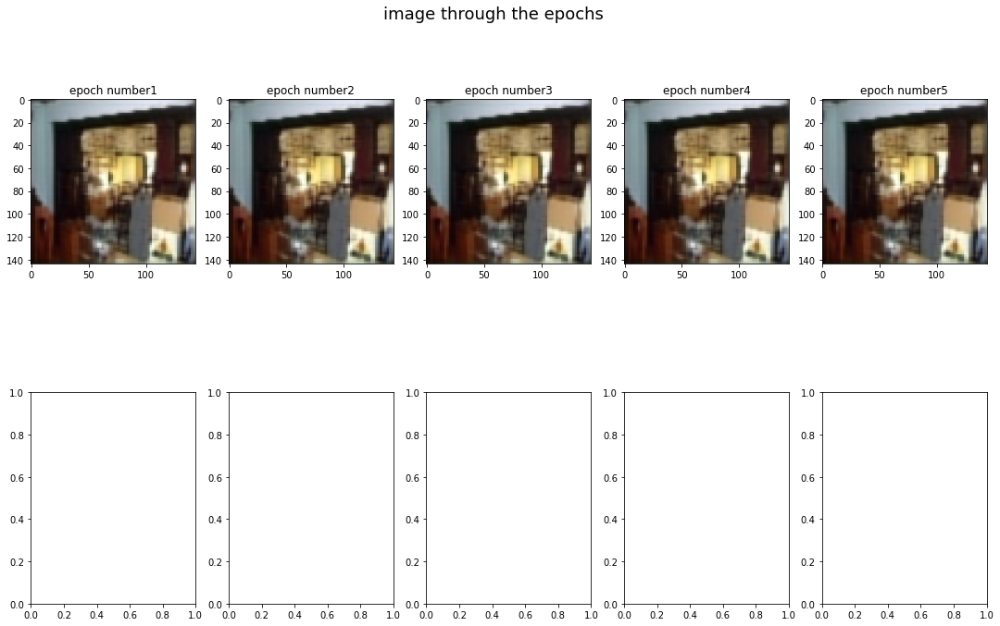

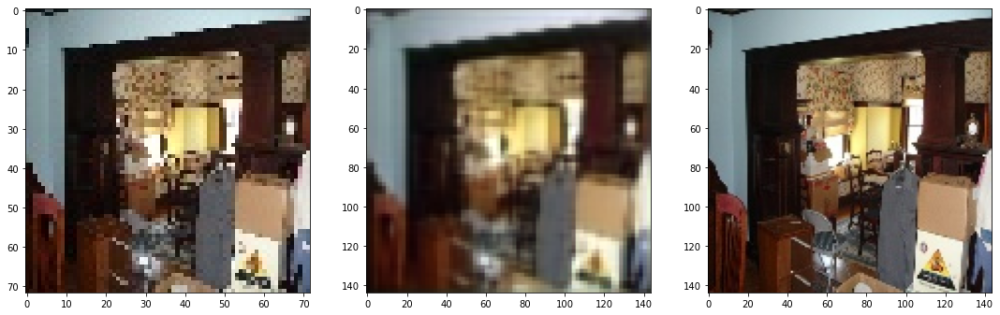

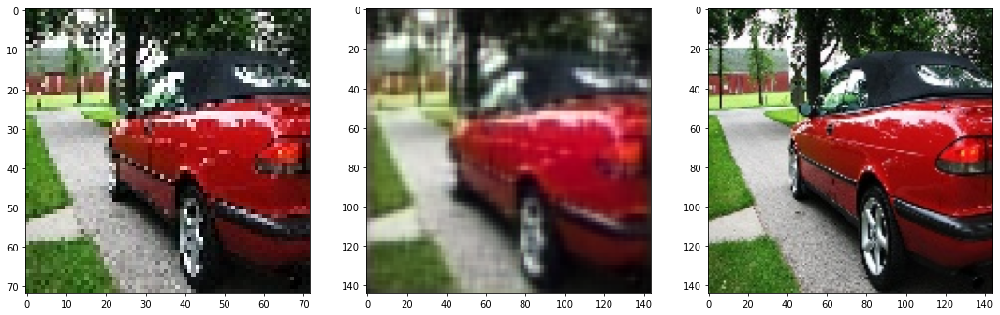

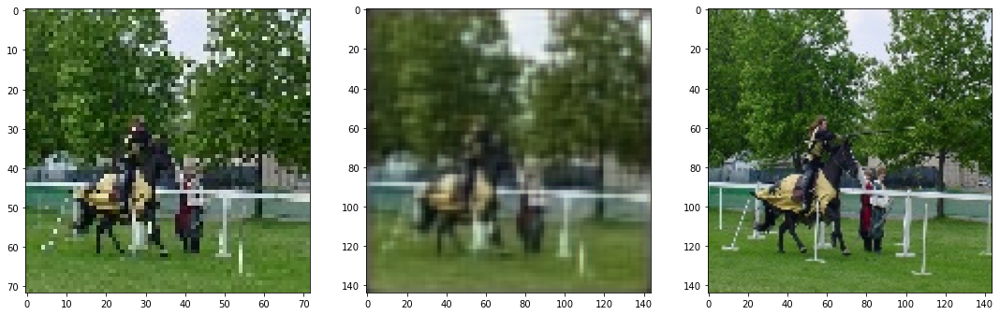

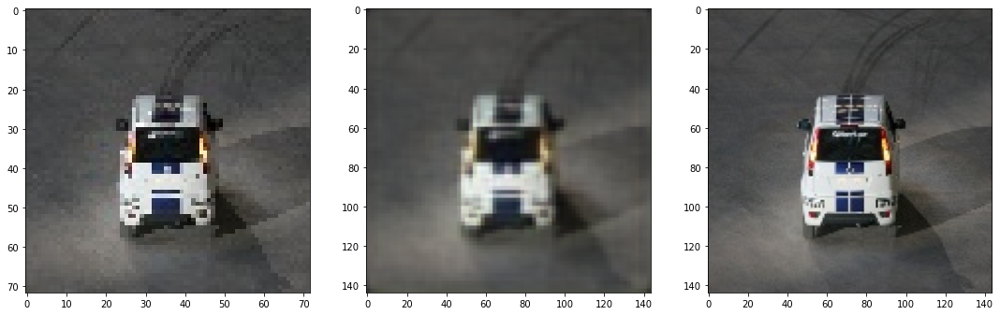

...

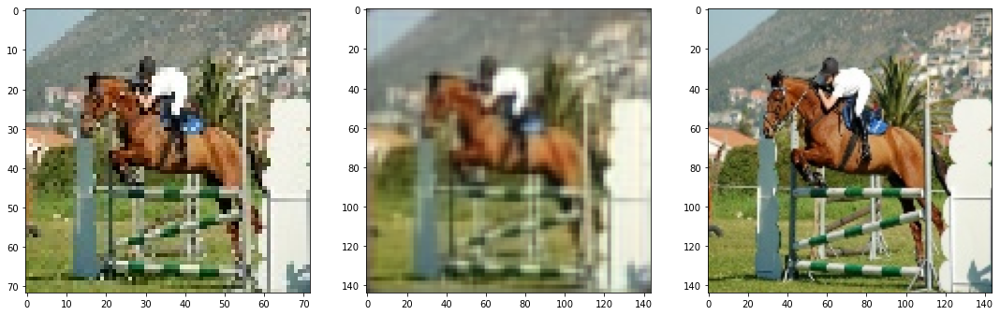

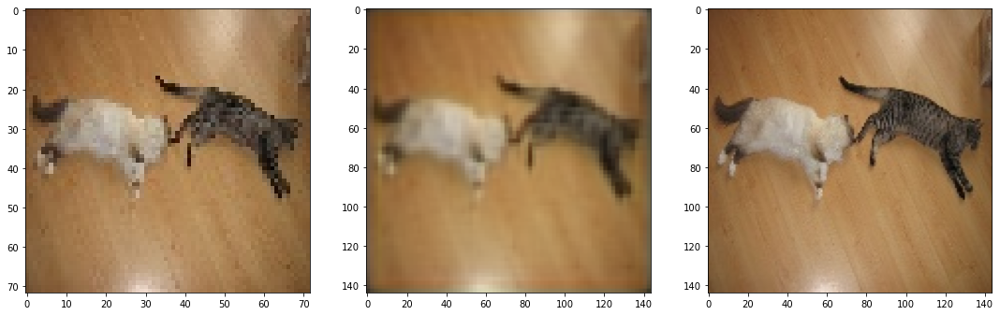

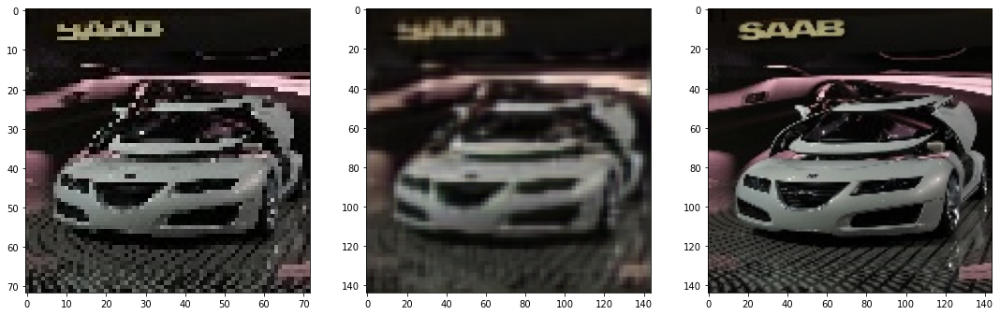

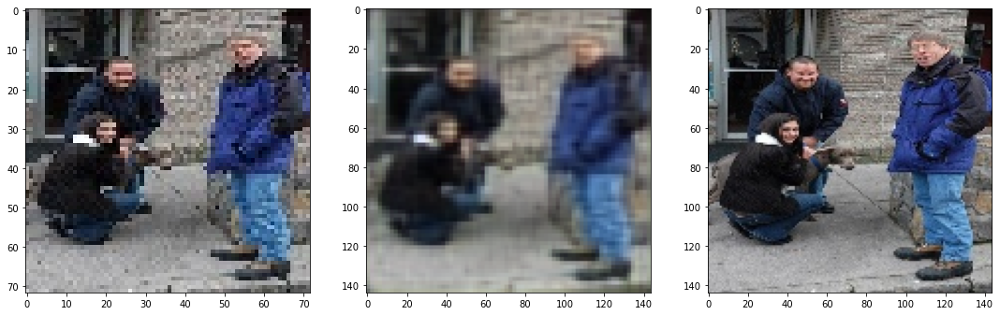

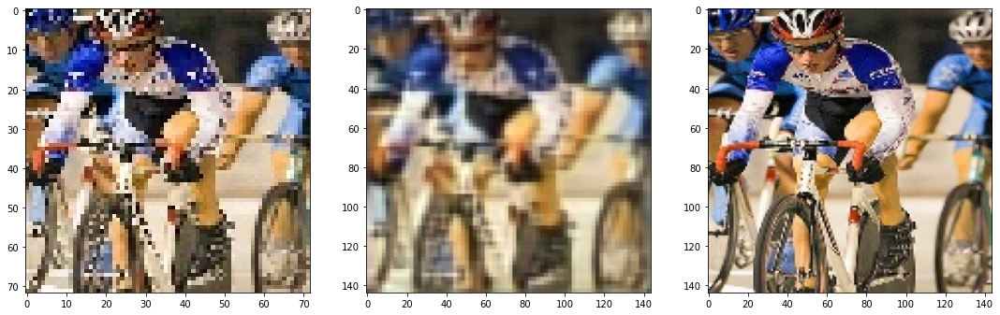

In [16]:
printImages(gif5, preds5)

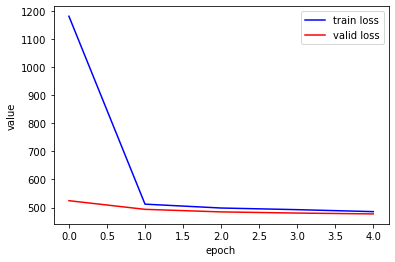

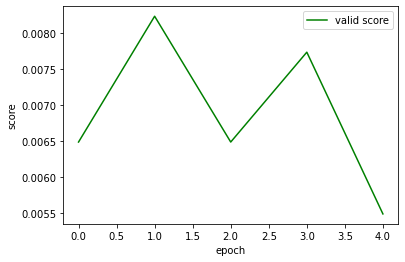

In [17]:
print_result(tr=metrics5, epochs=5)

In [18]:
class Step6Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.vgg = torchvision.models.vgg16(pretrained=True).to(device)
        for param in self.vgg.parameters():
            param.requires_grad = False
        self.extra = self.vgg.features[:3]
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=3, padding=1)
        self.upsample = nn.Upsample(scale_factor=(144/72), mode='bilinear').to(device) #, mode='bilinear'
        self.upsample2 = nn.Upsample(scale_factor=(288/144)).to(device)
        self.conv3 = nn.Conv2d(in_channels=128,out_channels=3, kernel_size=1)
        self.relu = nn.LeakyReLU()

    def forward(self, x, large=False):
        out = self.extra(x)
        out1 = self.conv1(x)
        out2 = self.conv2(out1)
        out3 = torch.concat((out2, out), dim=1)
        out4 = self.upsample(out3)
        out5 = self.relu(out4)
        if large:
            out5 = self.upsample2(out5)
        out6 = self.conv3(out5)
        return out6

In [19]:
model6 = Step6Model()
gif6, preds6, metrics6 = train(train_loader=train_dataloader, valid_loader=valid_dataloader, learn_rate=0.001, epochs=5, large=False, model=model6)

starting epoch number  0
Epoch 0......Step: 20/201....... Average Loss for Epoch: 3645.6078918457033
Epoch 0......Step: 40/201....... Average Loss for Epoch: 2443.384484863281
Epoch 0......Step: 60/201....... Average Loss for Epoch: 1937.915737915039
Epoch 0......Step: 80/201....... Average Loss for Epoch: 1645.1158905029297
Epoch 0......Step: 100/201....... Average Loss for Epoch: 1454.7686029052734
Epoch 0......Step: 120/201....... Average Loss for Epoch: 1314.7114430745444
Epoch 0......Step: 140/201....... Average Loss for Epoch: 1209.5963701520648
Epoch 0......Step: 160/201....... Average Loss for Epoch: 1131.3300384521485
Epoch 0......Step: 180/201....... Average Loss for Epoch: 1067.252739461263
Epoch 0......Step: 200/201....... Average Loss for Epoch: 1012.4870770263672
Epoch 0/5 Done, Total Loss: 1009.8391580913791
Time Elapsed for Epoch: 775.90625 seconds
PSNR avg = 21.249391091059632,test_loss = 516.059714, score = 0.0037415814417560487
starting epoch number  1
Epoch 1......S

<ipython-input-16-cda49081dc91>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gif13[i] = torch.tensor(gif1[i]).numpy().T.astype(np.float32)/255.0
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float32 to uint8. Range [-0.052966222167015076, 1.2105000019073486]. Convert image to uint8 prior to saving to suppress this w

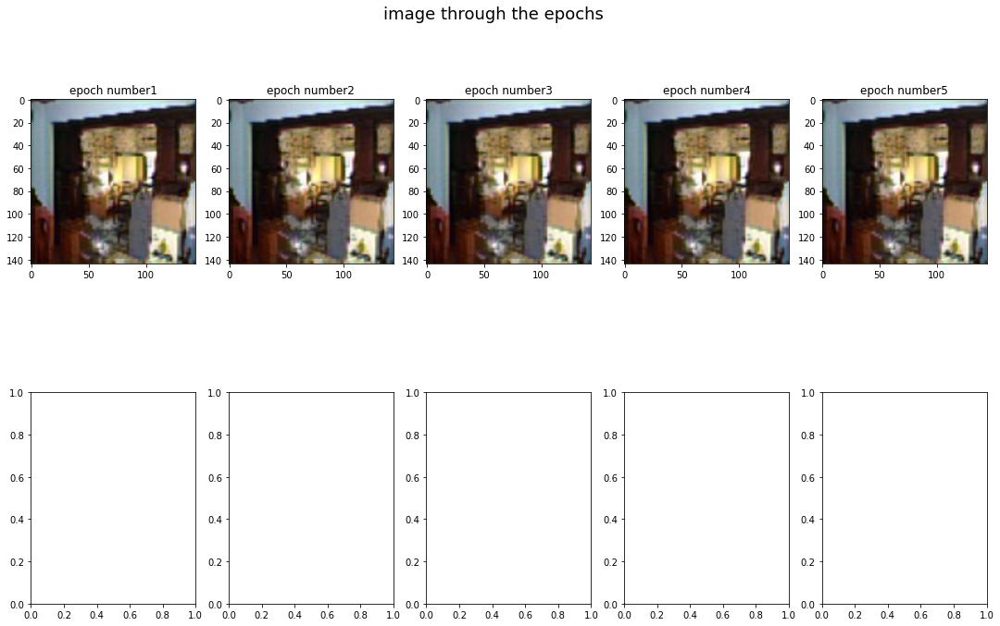

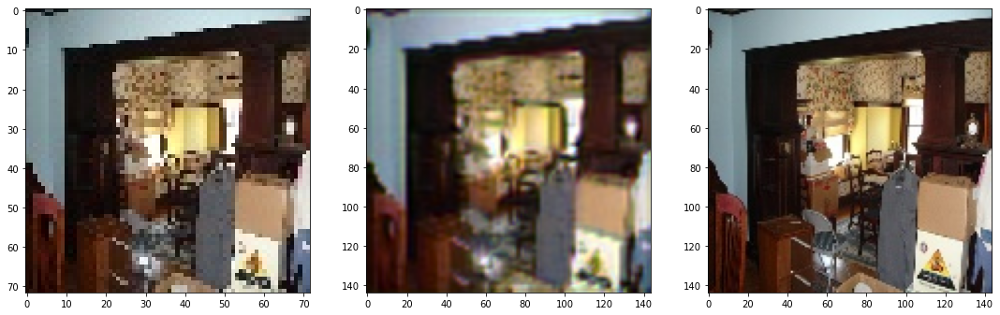

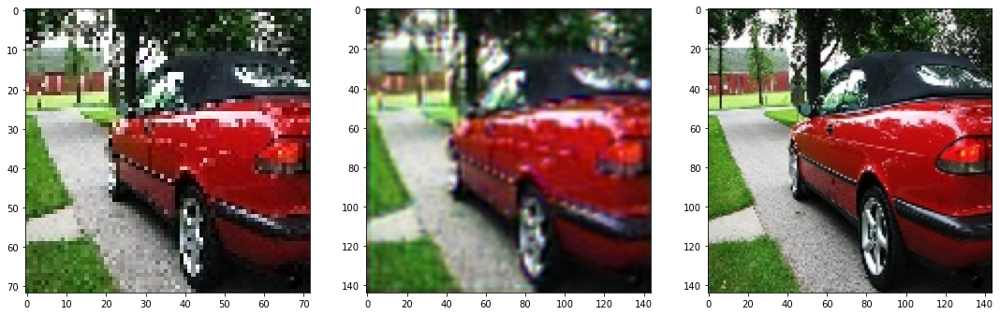

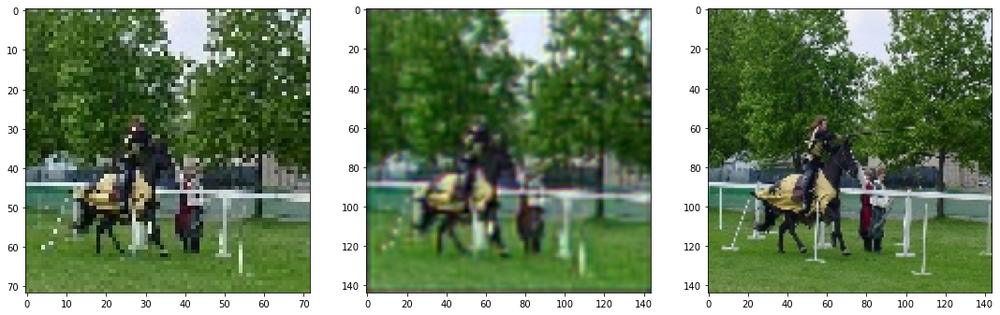

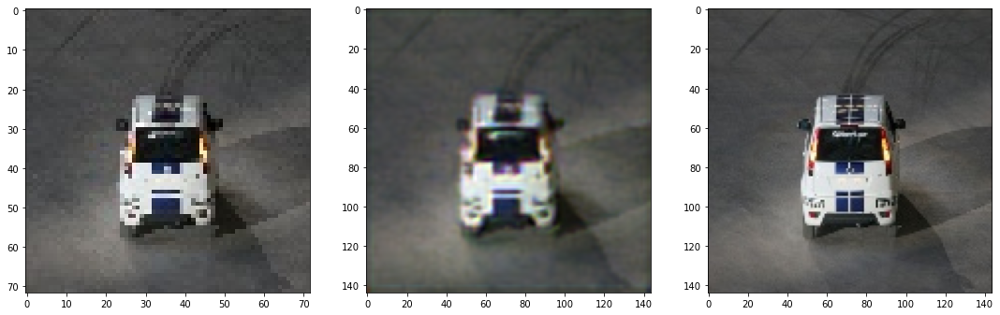

...

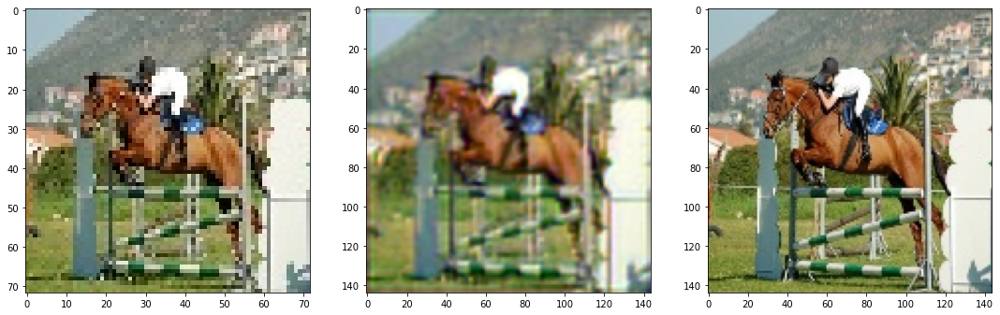

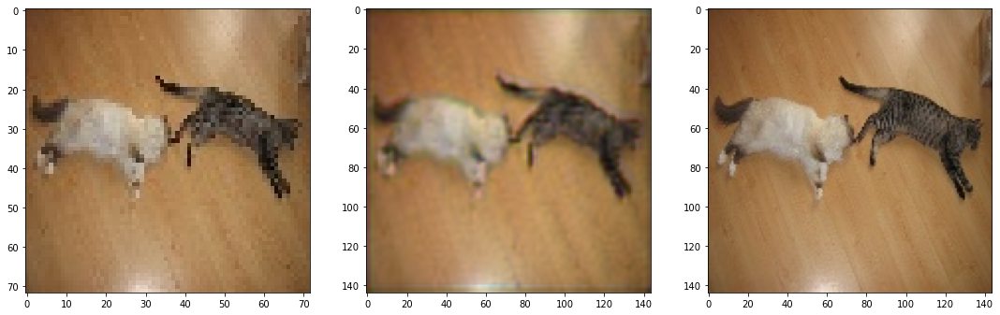

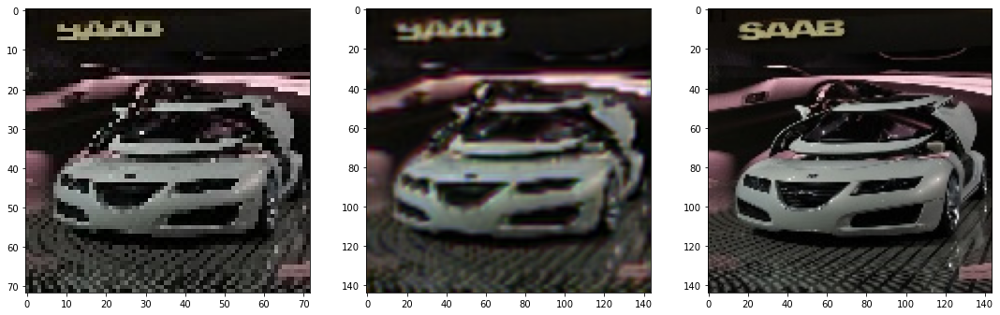

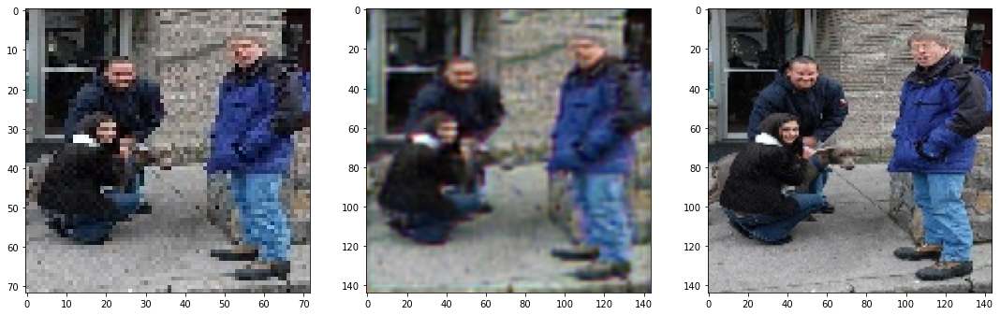

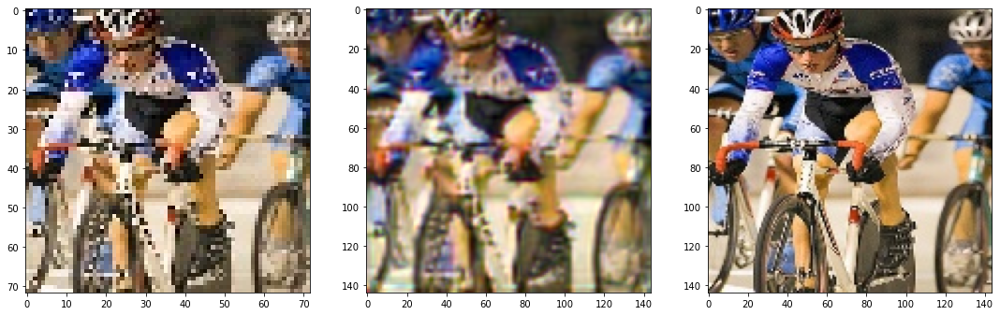

In [20]:
printImages(gif6, preds6)

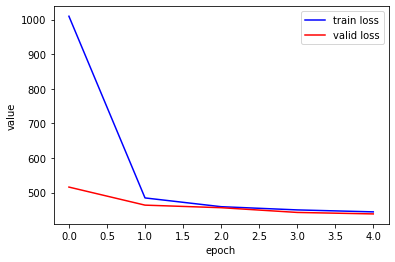

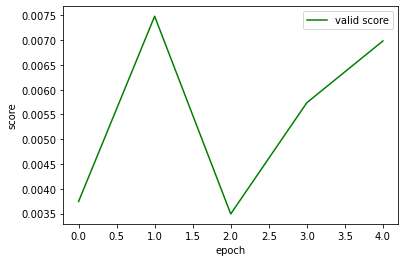

In [21]:
print_result(tr=metrics6, epochs=5)

In [120]:
import eagerpy as ep

class Step7Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.vgg = torchvision.models.vgg16(pretrained=True).to(device)
        for param in self.vgg.parameters():
            param.requires_grad = True
        self.extra = self.vgg.features[:3]
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=64,out_channels=64, kernel_size=3, padding=1)
        #self.upsample = nn.Upsample(scale_factor=(144/72), mode='bilinear').to(device) #, mode='bilinear'
        #self.upsample2 = nn.Upsample(scale_factor=(288/144)).to(device)
        self.conv3 = nn.Conv2d(in_channels=128,out_channels=3, kernel_size=1)
        self.relu = nn.LeakyReLU() #Leaky

    def forward(self, x, large=False):
        out = self.extra(x)
        out1 = self.conv1(x)
        out2 = self.conv2(out1)
        print(type(out2))
        out3 = torch.concat((out2, out), dim=1)
        out4 = tf.nn.depth_to_space(out3.detach().numpy(), 6)
        
        #out5 = self.relu(out4)
        if large:
            out4 = tf.nn.depth_to_space(out4.detach().numpy())
        #out4 = out4.numpy().type(torch.tensor)
        #out4 = tf.convert_to_tensor(out4.numpy())
        out4 = torch.tensor(ep.astensors(out4))
        #print(type(out4))
        out6 = self.conv3(out4)
        return out6

In [122]:
model7 = Step7Model()
gif7, preds7 = train(train_loader=train_dataloader, valid_loader=valid_dataloader, learn_rate=0.001, epochs=5, large=False, model=model7)

In [ ]:
printImages(gif7, preds7)

## i choose to train the model from step 3. for that i increase the number of epochs

In [11]:
model5_final = Step5Model()
gif5_final, preds5_final, metrics5_final = train(train_loader=train_dataloader, valid_loader=valid_dataloader, learn_rate=0.001, epochs=10, large=False, model=model5_final)

starting epoch number  0
Epoch 0......Step: 20/201....... Average Loss for Epoch: 3915.1664794921876
Epoch 0......Step: 40/201....... Average Loss for Epoch: 2495.3614761352537
Epoch 0......Step: 60/201....... Average Loss for Epoch: 1930.3131032307942
Epoch 0......Step: 80/201....... Average Loss for Epoch: 1623.2225219726563
Epoch 0......Step: 100/201....... Average Loss for Epoch: 1430.3876293945314
Epoch 0......Step: 120/201....... Average Loss for Epoch: 1290.1331347147623
Epoch 0......Step: 140/201....... Average Loss for Epoch: 1190.4186933244978
Epoch 0......Step: 160/201....... Average Loss for Epoch: 1113.9998361587525
Epoch 0......Step: 180/201....... Average Loss for Epoch: 1050.6528064303927
Epoch 0......Step: 200/201....... Average Loss for Epoch: 996.9709437561036
Epoch 0/10 Done, Total Loss: 994.4388588672847
Time Elapsed for Epoch: 663.640625 seconds
PSNR avg = 21.236156893120597,test_loss = 514.902675, score = 0.003991020204539786
starting epoch number  1
Epoch 1.....

RuntimeError: [enforce fail at ..\c10\core\CPUAllocator.cpp:76] data. DefaultCPUAllocator: not enough memory: you tried to allocate 6981230592 bytes.

In [ ]:
printImages(gif5_final, preds5_final)

In [ ]:
print_result(tr=metrics5_final, epochs=20)